# Kawaii dreambooth

The objective of this notebook is to generate images in a predefined style labeled as 'kawaii_style', allowing the user to provide an input image of their dog or cat and receive a corresponding kawaii-styled image of the same animal

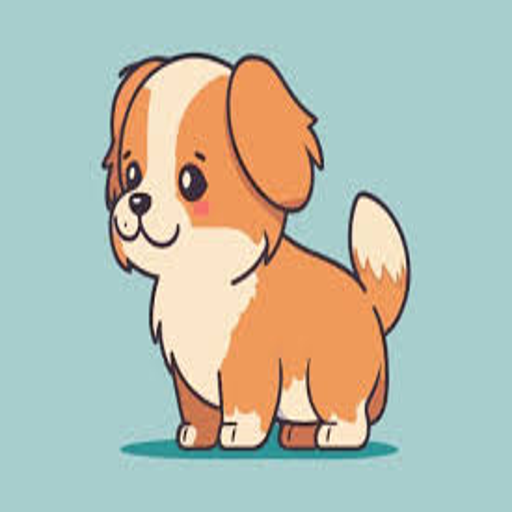

In [17]:
im_p = '/content/dreambooth/images/im3.jpg'
im = Image.open(im_p).resize((512, 512))
im

In [1]:
!pip install huggingface_hub

In [2]:
!pip install --upgrade bitsandbytes xformers
!pip install git+https://github.com/huggingface/diffusers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.1/76.1 MB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.5/31.5 MB 51.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.2/865.2 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 393.1/393.1 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 90.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 70.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 55.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 571.0/571.0 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.2/200.2 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 61.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.2/158.2 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.6

In [3]:
!pip install --upgrade diffusers transformers accelerate safetensors

In [4]:
!pip install --upgrade torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install --upgrade diffusers transformers accelerate fastdownload

Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 52.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 875.6/875.6 kB 37.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 36.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.9/663.9 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.9/417.9 MB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 MB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 MB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.1/204.1 MB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 MB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 955.6/9

In [5]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image
import json
import diffusers

from PIL import ImageDraw
import os
import random
from tqdm import tqdm

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

In [6]:
from diffusers import StableDiffusionPipeline
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

In [7]:
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler

from accelerate import Accelerator

from pathlib import Path
from huggingface_hub import create_repo, upload_folder

In [8]:
import subprocess

TRAINING THE MODEL

Before fine-tuning our model, we need to make sure we have the following folder structure:

/content/

└── dreambooth/

    ├── images/                ← 📸 📂 Folder containing the images of the person/object to be trained
    │   ├── img1.jpg
    │   ├── img2.jpg
    │   └── imgN.jpg
    │
    ├── output/                ← 📂 📤 The directory where the trained model will be saved after running train_dreambooth.py
    │   ├── scheduler/
    │   ├── text_encoder/
    │   ├── unet/
    │   ├── vae/
    │   ├── model_index.json
    │   └── ...
    │
    └── train_dreambooth.py    ← 📜 The training script you downloaded from diffusers/examples/dreambooth


In [18]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    	       "CompVis/stable-diffusion-v1-4",
    	       variant="fp16", torch_dtype=torch.float16, use_auth_token=True).to("cuda")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [19]:
pretrained_model_name_or_path = "runwayml/stable-diffusion-v1-5"
instance_data_dir = "/content/dreambooth/images"
output_dir = "/content/dreambooth/output/"
instance_prompt = "kawaii_style"
num_train_steps = 800

In [27]:
!rm -rf /content/dreambooth/images/.ipynb_checkpoints

In [28]:
!accelerate launch /content/diffusers/examples/dreambooth/train_dreambooth.py \
  --pretrained_model_name_or_path="runwayml/stable-diffusion-v1-5" \
  --instance_data_dir="/content/dreambooth/images" \
  --output_dir="/content/dreambooth/output" \
  --instance_prompt="kawaii_style" \
  --resolution=512 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=1 \
  --learning_rate=5e-6 \
  --lr_scheduler="constant" \
  --max_train_steps=800 \
  --mixed_precision="fp16" \
  --use_8bit_adam

The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
2025-05-05 22:23:01.263520: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746483781.283477    9491 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746483781.289566    9491 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
05/05/2025 22:23:06 - INFO - __main__ - Distributed en

TESTING

In [97]:
pipe = StableDiffusionPipeline.from_pretrained(
    output_dir,
    torch_dtype=torch.float16
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

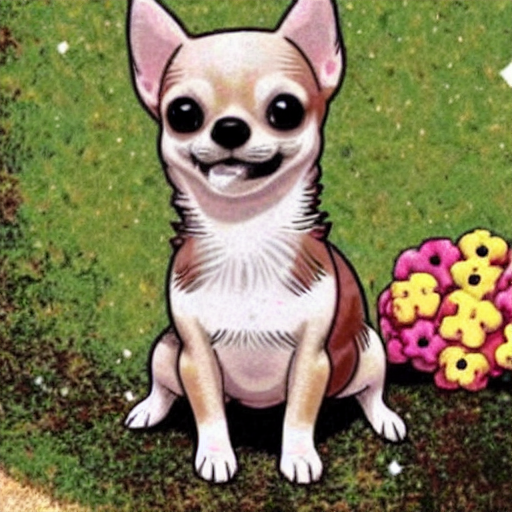

In [99]:
torch.manual_seed(4)

prompt = "a chihuahua dog in kawaii_style"
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]

image

  0%|          | 0/30 [00:00<?, ?it/s]

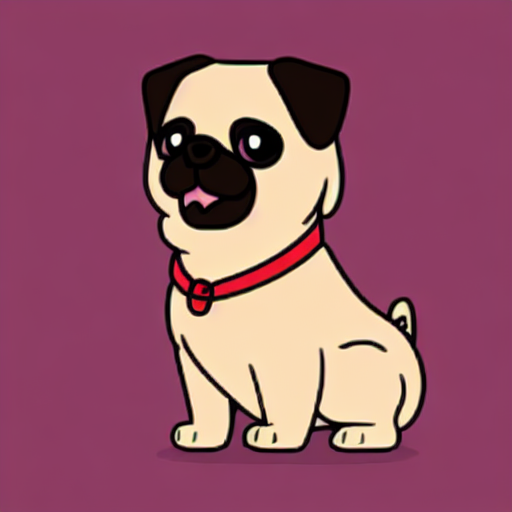

In [101]:
torch.manual_seed(6)

prompt = "a pug dog in kawaii_style"
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]

image

  0%|          | 0/30 [00:00<?, ?it/s]

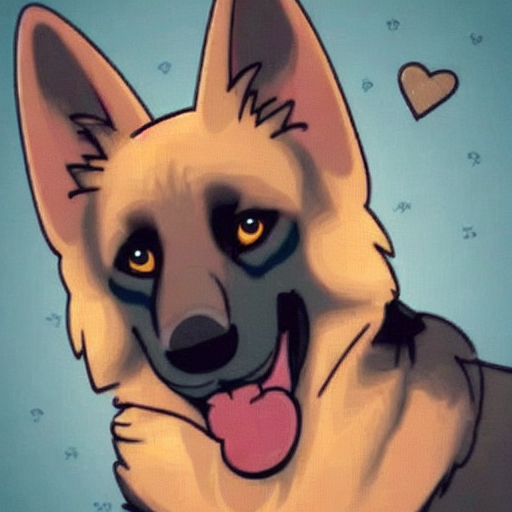

In [107]:
torch.manual_seed(25)

prompt = "a german shepherd dog in kawaii_style"
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]

image

  0%|          | 0/30 [00:00<?, ?it/s]

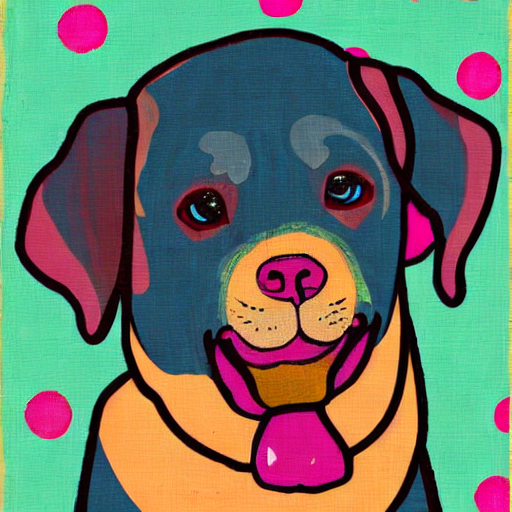

In [31]:
torch.manual_seed(5)

prompt = "a labrador dog in kawaii_style painting"
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]

image

  0%|          | 0/30 [00:00<?, ?it/s]

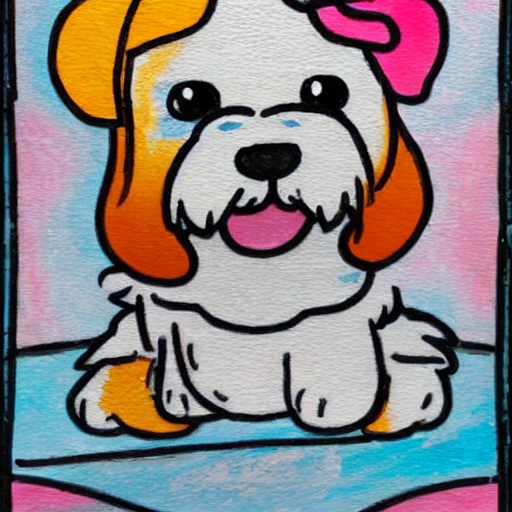

In [32]:
torch.manual_seed(150)

prompt = "a maltese dog in kawaii_style painting"
image = pipe(prompt, num_inference_steps=30, guidance_scale=7.5).images[0]

image

IMAGE 2 IMAGE

In [33]:
model_path = "/content/dreambooth/output"

pipe_img2img = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

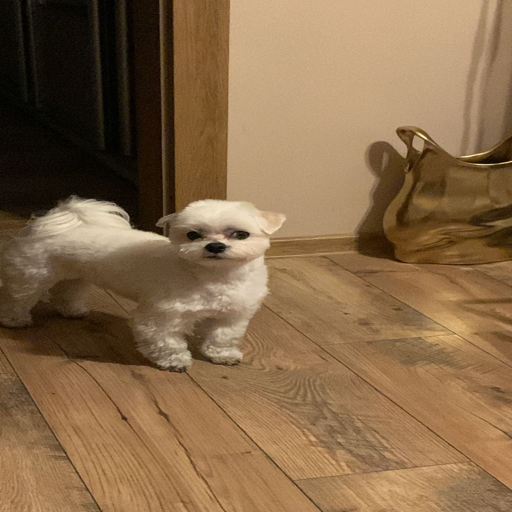

In [37]:
im_p = '/content/Pepe_picture.jpg'
init_image = Image.open(im_p).resize((512, 512))
init_image

  0%|          | 0/35 [00:00<?, ?it/s]

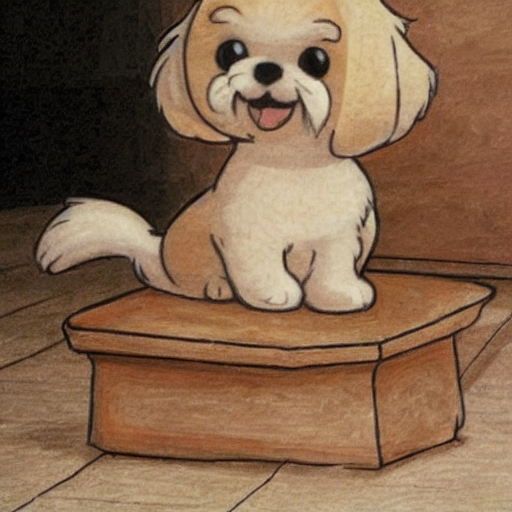

In [95]:
torch.manual_seed(12)

prompt = 'a maltese dog in kawaii_style, cartoon'

images = pipe_img2img(
    prompt=prompt,
    image=init_image,
    strength=0.7,
    num_inference_steps=50,
    guidance_scale=7.5
).images[0]

images

In [96]:
images.save("/content/dreambooth/images generated/generated_10.jpg")

  0%|          | 0/35 [00:00<?, ?it/s]

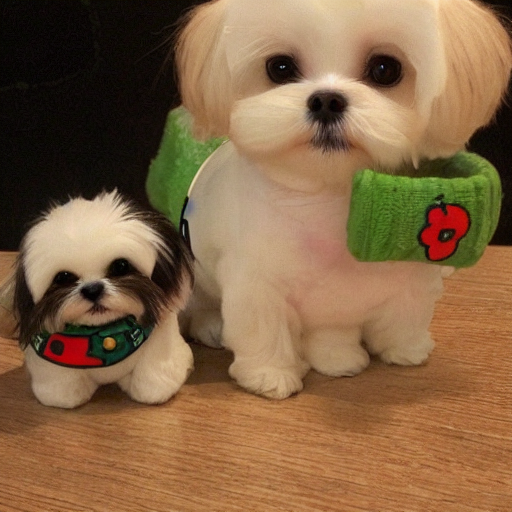

In [62]:
torch.manual_seed(100)

prompt = 'a maltese dog in kawaii_style'

images = pipe_img2img(
    prompt=prompt,
    image=init_image,
    strength=0.7,
    num_inference_steps=50,
    guidance_scale=7.5
).images[0]

images

In [63]:
image.save("/content/dreambooth/images generated/generated_2.jpg")

  0%|          | 0/35 [00:00<?, ?it/s]

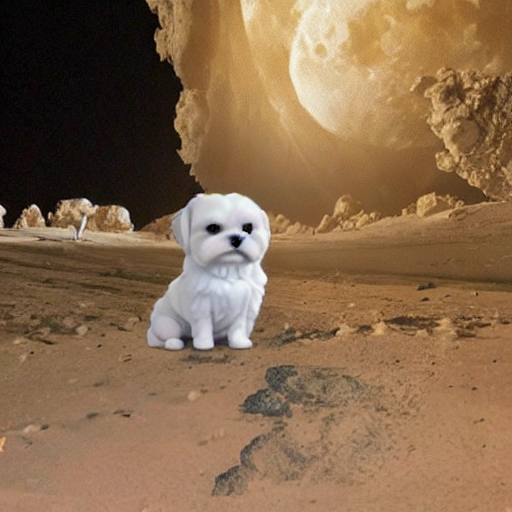

In [93]:
torch.manual_seed(13)

prompt = 'a maltese dog in kawaii_style in the moon'

images = pipe_img2img(
    prompt=prompt,
    image=init_image,
    strength=0.7,
    num_inference_steps=50,
    guidance_scale=7.5
).images[0]

images

In [94]:
images.save("/content/dreambooth/images generated/generated_2.jpg")

  0%|          | 0/35 [00:00<?, ?it/s]

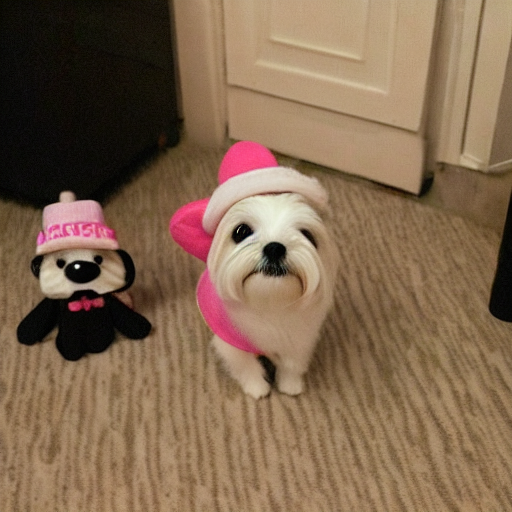

In [69]:
torch.manual_seed(30)

prompt = 'a maltese dog in kawaii_style with a pink hat'

images = pipe_img2img(
    prompt=prompt,
    image=init_image,
    strength=0.7,
    num_inference_steps=50,
    guidance_scale=7.5
).images[0]

images

In [70]:
image.save("/content/dreambooth/images generated/generated_4.jpg")

In [77]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [79]:
num_rows,num_cols = 4,4
prompts = [prompt] * num_cols

In [81]:
images = concat(pipe(prompts, guidance_scale=g).images for g in [1.1,3,7,14])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

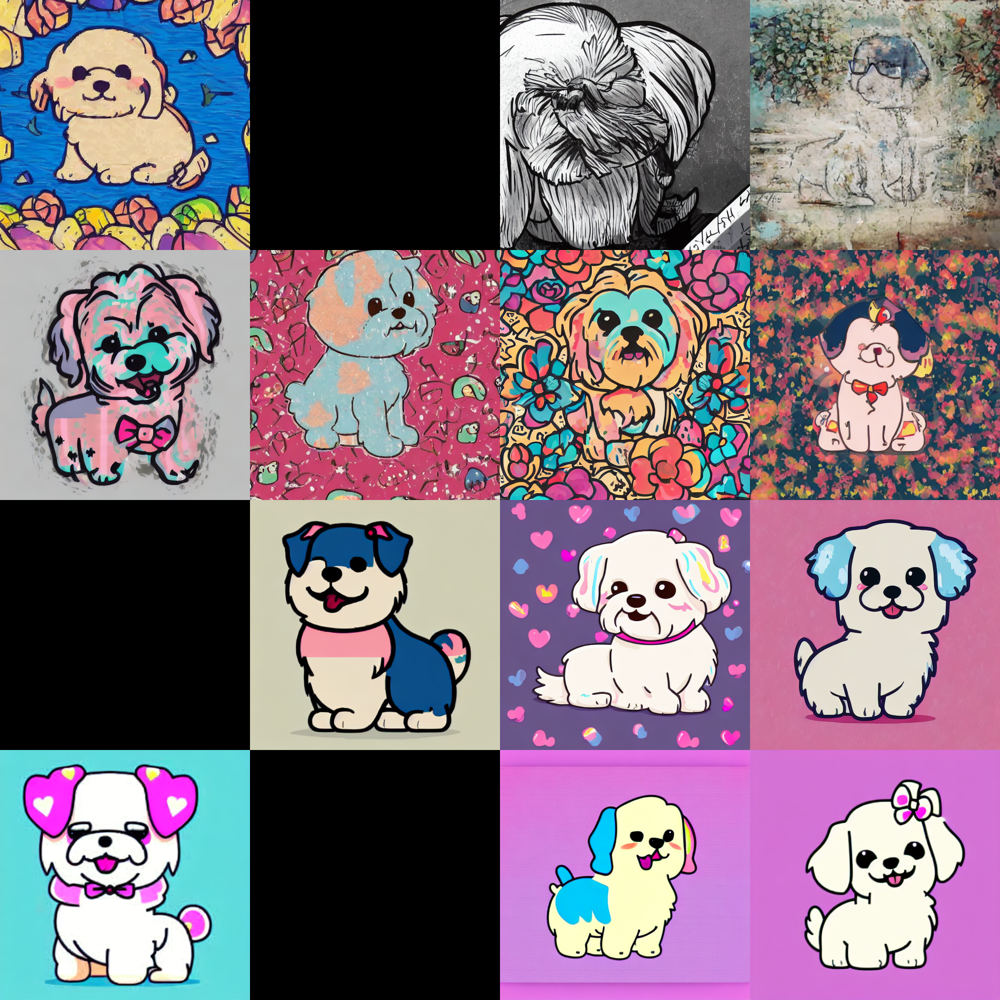

In [82]:
image_grid(images, rows=num_rows, cols=num_cols)

In [86]:
images[6].save("/content/dreambooth/images generated/generated_5.jpg")

In [87]:
images[4].save("/content/dreambooth/images generated/generated_6.jpg")
images[5].save("/content/dreambooth/images generated/generated_7.jpg")
images[9].save("/content/dreambooth/images generated/generated_8.jpg")
images[10].save("/content/dreambooth/images generated/generated_9.jpg")

In [89]:
!pip install --upgrade huggingface_hub

LOADING

In [90]:
from huggingface_hub import login

login()

In [91]:
from huggingface_hub import create_repo

repo_name = "dreambooth-kawaii"

create_repo(repo_name, private=True)

RepoUrl('https://huggingface.co/LordAmadeus/dreambooth-kawaii', endpoint='https://huggingface.co', repo_type='model', repo_id='LordAmadeus/dreambooth-kawaii')

In [92]:
from huggingface_hub import upload_folder

upload_folder(
    folder_path="/content/dreambooth/output",
    repo_id=f"LordAmadeus/{repo_name}",
    commit_message="Subida de modelo DreamBooth entrenado"
)

optimizer.bin:   0%|          | 0.00/1.75G [00:00<?, ?B/s]

random_states_0.pkl:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

scheduler.bin:   0%|          | 0.00/1.40k [00:00<?, ?B/s]

Upload 13 LFS files:   0%|          | 0/13 [00:00<?, ?it/s]

scaler.pt:   0%|          | 0.00/1.38k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

events.out.tfevents.1746483595.ba3edff95ec1.8629.1:   0%|          | 0.00/2.83k [00:00<?, ?B/s]

events.out.tfevents.1746483802.ba3edff95ec1.9491.1:   0%|          | 0.00/2.83k [00:00<?, ?B/s]

events.out.tfevents.1746483595.ba3edff95ec1.8629.0:   0%|          | 0.00/498 [00:00<?, ?B/s]

events.out.tfevents.1746483802.ba3edff95ec1.9491.0:   0%|          | 0.00/67.0k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/LordAmadeus/dreambooth-kawaii/commit/5ffa7c01c69736bf16e089963a477e3f9eb43320', commit_message='Subida de modelo DreamBooth entrenado', commit_description='', oid='5ffa7c01c69736bf16e089963a477e3f9eb43320', pr_url=None, repo_url=RepoUrl('https://huggingface.co/LordAmadeus/dreambooth-kawaii', endpoint='https://huggingface.co', repo_type='model', repo_id='LordAmadeus/dreambooth-kawaii'), pr_revision=None, pr_num=None)